# 0.0 IMPORTS


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
import numpy as np
from scipy.stats import chi2_contingency, shapiro
import warnings
from IPython.core.display           import HTML
from sklearn                   import model_selection    as ms


pd.options.display.max_columns = None

In [2]:
def jupyter_settings():
    %matplotlib inline
    %pylab inline
    
    plt.style.use( 'bmh' )
    plt.rcParams['figure.figsize'] = [25, 12]
    plt.rcParams['font.size'] = 24
    
    display( HTML( '<style>.container { width:100% !important; }</style>') )
    pd.options.display.max_columns = None
    pd.options.display.max_rows = None
    pd.set_option( 'display.expand_frame_repr', False )
    
    sns.set()
jupyter_settings()
warnings.filterwarnings("ignore")

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


## 0.1 Load data set

In [3]:
df_raw=pd.read_csv('../data/raw/application_train.csv')
# df_test=pd.read_csv('../data/raw/application_test.csv')
# bbalance=pd.read_csv('../data/raw/bureau_balance.csv')
# bureau=pd.read_csv('../data/raw/bureau.csv')
# ccbalance=pd.read_csv('../data/raw/credit_card_balance.csv')
# installments=pd.read_csv('../data/raw/installments_payments.csv')
# # Monthly balance snapshots of previous POS (point of sales) and cash loans that the applicant had with Home Credit.
# cash_balance=pd.read_csv('../data/raw/POS_CASH_balance.csv')
# previous_app=pd.read_csv('../data/raw/previous_application.csv')
# bb=pd.read_csv('')

In [5]:
df_raw.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [6]:
# df_test.head()

In [7]:
# bbalance.head()

In [8]:
# bureau.head()

In [9]:
# ccbalance.head()

In [10]:
# installments.head()

In [11]:
# cash_balance.head()

In [12]:
# previous_app.head()

#  01 - Data Description

- The objective is to use statistical metrics to identify outliers in the scope of the business.

In [13]:
df1= df_raw.copy()

In [14]:
# rename columns
# data dimensions
# data types
# check na
# desc stats
# num att
# - relevant observations
# cat att
# - countplot
# target var

### 1.1 Data Dimensions

In [15]:
# data = [df_raw, df_test, bbalance, bureau, ccbalance, installments, cash_balance, previous_app]
data = [df1]

dataframes_name = ['df_raw', 'df_test', 'bbalance', 'bureau', 'ccbalance', 'installments', 'cash_balance', 'previous_app']

for dataf, names in zip(data, dataframes_name):
    print(f"The dataframe {names} has: The number of rows of {dataf.shape[0]} and the number of columns of {dataf.shape[1]}\n")


The dataframe df_raw has: The number of rows of 307511 and the number of columns of 122



### 1.2 Data Types

In [16]:
for dataf, names in zip(data, dataframes_name):
    print(f"The dataframe {names} have this structure {dataf.info()}\n")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
The dataframe df_raw have this structure None



### 1.3 Check NA

Actions taken:

- Dropped columns with more than 50% of NaN value
- filled Na with zero for remaining columns (81)

In [17]:
for dataf, names in zip(data, dataframes_name):
    print(f"THE DATA FRAME {names} HAS THIS CONDITION OF NaN \n{dataf.isna().sum()}\n")

THE DATA FRAME df_raw HAS THIS CONDITION OF NaN 
SK_ID_CURR                           0
TARGET                               0
NAME_CONTRACT_TYPE                   0
CODE_GENDER                          0
FLAG_OWN_CAR                         0
FLAG_OWN_REALTY                      0
CNT_CHILDREN                         0
AMT_INCOME_TOTAL                     0
AMT_CREDIT                           0
AMT_ANNUITY                         12
AMT_GOODS_PRICE                    278
NAME_TYPE_SUITE                   1292
NAME_INCOME_TYPE                     0
NAME_EDUCATION_TYPE                  0
NAME_FAMILY_STATUS                   0
NAME_HOUSING_TYPE                    0
REGION_POPULATION_RELATIVE           0
DAYS_BIRTH                           0
DAYS_EMPLOYED                        0
DAYS_REGISTRATION                    0
DAYS_ID_PUBLISH                      0
OWN_CAR_AGE                     202929
FLAG_MOBIL                           0
FLAG_EMP_PHONE                       0
FLAG_WORK_PHONE

In [18]:
def missing_values_table(df):
        mis_val = df.isnull().sum()
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)

        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        return mis_val_table_ren_columns

In [19]:
missing_values_table(df1).head(122)

,Missing Values,% of Total Values
COMMONAREA_MEDI,214865,69.9
COMMONAREA_AVG,214865,69.9
COMMONAREA_MODE,214865,69.9
NONLIVINGAPARTMENTS_MEDI,213514,69.4
NONLIVINGAPARTMENTS_MODE,213514,69.4
NONLIVINGAPARTMENTS_AVG,213514,69.4
FONDKAPREMONT_MODE,210295,68.4
LIVINGAPARTMENTS_MODE,210199,68.4
LIVINGAPARTMENTS_MEDI,210199,68.4
LIVINGAPARTMENTS_AVG,210199,68.4


move to filter later

In [20]:
# calculation of total NaN value per column
na_percentage=(df_raw.isna().sum()/len(df_raw))*100

# filtering columns under 50% of NaN values
under_fifty=list(na_percentage[na_percentage <= 50].index)

# applying the filter to raw data frame and getting clean dataframe
df1=df1[under_fifty].copy()
df1.shape

(307511, 81)

In [21]:
df1=df1.fillna(0)

In [22]:
df1.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,0.9722,0.0833,0.9722,0.0833,0.9722,0.0833,0.0149,No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.000000,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.000000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.000000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [23]:
df1.isna().sum()

SK_ID_CURR                      0
TARGET                          0
NAME_CONTRACT_TYPE              0
CODE_GENDER                     0
FLAG_OWN_CAR                    0
FLAG_OWN_REALTY                 0
CNT_CHILDREN                    0
AMT_INCOME_TOTAL                0
AMT_CREDIT                      0
AMT_ANNUITY                     0
AMT_GOODS_PRICE                 0
NAME_TYPE_SUITE                 0
NAME_INCOME_TYPE                0
NAME_EDUCATION_TYPE             0
NAME_FAMILY_STATUS              0
NAME_HOUSING_TYPE               0
REGION_POPULATION_RELATIVE      0
DAYS_BIRTH                      0
DAYS_EMPLOYED                   0
DAYS_REGISTRATION               0
DAYS_ID_PUBLISH                 0
FLAG_MOBIL                      0
FLAG_EMP_PHONE                  0
FLAG_WORK_PHONE                 0
FLAG_CONT_MOBILE                0
FLAG_PHONE                      0
FLAG_EMAIL                      0
OCCUPATION_TYPE                 0
CNT_FAM_MEMBERS                 0
REGION_RATING_

### 1.4 Descriptive Statistics




Next cycle:
- columns with avg try to imput avg based on available values
- to improve the model's perf check input from sklearn and see the option(mean, median, etc...)
- use pandas prof and sweetviz

#### 1.4.1 Numerical

In [24]:
def descriptive_statistics(df):

    """
    Shows the main values ​​for descriptive statistics in numerical variables.

    Args:
        data ([float64 and int64]): [Insert all numerical attributes in the dataset]

    Returns:
        [dataframe]: [A dataframe with mean, median, std deviation, skewness, kurtosis, min, max, range, normalty]
    """
    # Obtain only nuerical columns
    df1_num=df.select_dtypes(include=['int64', 'float64']).fillna(0)


    # Central Tendency - mean, meadina
    ct1= pd.DataFrame(df1_num.apply(np.mean)).T
    ct2= pd.DataFrame(df1_num.apply(np.median)).T

    # dispersion - std, min, max, range, skew, kurtosis
    ct3= pd.DataFrame(df1_num.apply(np.std)).T
    ct4= pd.DataFrame(df1_num.apply(min)).T
    ct5= pd.DataFrame(df1_num.apply(max)).T
    ct6= pd.DataFrame(df1_num.apply(lambda x: x.max() - x.min())).T
    ct7= pd.DataFrame(df1_num.apply(lambda x: x.skew())).T
    ct8= pd.DataFrame(df1_num.apply(lambda x: x.kurtosis())).T
    ct9 = pd.DataFrame(df1_num.apply(lambda x: 'not normal' if shapiro(x.sample(5000))[1] < 0.05 else 'normal')).T


    # concatenar
    df_statistics= pd.concat([ct4, ct5, ct6, ct1, ct2,ct3, ct7, ct8, ct9]).T
    df_statistics.columns=['min', 'max', 'range', 'mean', 'median', 'std', 'skew', 'kurtosis', 'shapiro']
    df_statistics.round(2)

    return df_statistics

In [25]:
descriptive_statistics=descriptive_statistics(df1)
descriptive_statistics.head(50)

,min,max,range,mean,median,std,skew,kurtosis,shapiro
SK_ID_CURR,100002.0,456255.0,356253.0,278180.518577,278202.0,102790.008216,-0.0012,-1.198988,not normal
TARGET,0.0,1.0,1.0,0.080729,0.0,0.272418,3.078159,7.475109,not normal
CNT_CHILDREN,0.0,19.0,19.0,0.417052,0.0,0.72212,1.974604,7.904106,not normal
AMT_INCOME_TOTAL,25650.0,117000000.0,116974350.0,168797.919297,147150.0,237122.760726,391.559654,191786.554381,not normal
AMT_CREDIT,45000.0,4050000.0,4005000.0,599025.999706,513531.0,402490.122562,1.234778,1.934041,not normal
AMT_ANNUITY,0.0,258025.5,258025.5,27107.516051,24903.0,14494.42019,1.579448,7.705753,not normal
AMT_GOODS_PRICE,0.0,4050000.0,4050000.0,537909.479651,450000.0,369633.151639,1.34689,2.427168,not normal
REGION_POPULATION_RELATIVE,0.00029,0.072508,0.072218,0.020868,0.01885,0.013831,1.488009,3.260065,not normal
DAYS_BIRTH,-25229.0,-7489.0,17740.0,-16036.995067,-15750.0,4363.981536,-0.115673,-1.049126,not normal
DAYS_EMPLOYED,-17912.0,365243.0,383155.0,63815.045904,-1213.0,141275.53681,1.664346,0.771612,not normal


In [26]:
# ,AMT_INCOME_TOTAL,Income of the client,
# AMT_CREDIT,Credit amount of the loan,
# AMT_ANNUITY,Loan annuity

In [27]:
df1['DAYS_EMPLOYED'] / 365.25

0          -1.744011
1          -3.252567
2          -0.616016
3          -8.320329
4          -8.317591
5          -4.347707
6          -8.569473
7          -1.229295
8         999.980835
9          -5.527721
10         -1.859001
11        999.980835
12         -7.438741
13         -8.290212
14         -0.555784
15         -3.167693
16         -3.605749
17         -0.522930
18        -21.366188
19         -5.579740
20        -11.734428
21         -4.522930
22        -11.789185
23        999.980835
24         -2.042437
25         -9.566051
26         -7.195072
27         -3.378508
28         -4.917180
29         -2.765229
30         -7.304586
31         -3.022587
32        -12.057495
33         -5.639973
34        -12.553046
35         -3.490760
36         -2.102669
37         -3.526352
38        999.980835
39         -4.821355
40         -3.455168
41         -1.300479
42         -9.848049
43        999.980835
44         -2.075291
45         -2.450376
46        999.980835
47        -14

move to feature eng later

In [28]:
df1['AGE']=((df1['DAYS_BIRTH'] / -365.25)).round(0)

#### 1.4.2 Categorical

In [29]:
df_cat=df_raw.select_dtypes(exclude=['int64', 'float64'])
df_cat.head(20)

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,reg oper account,block of flats,"Stone, brick",No
1,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,Core staff,MONDAY,School,reg oper account,block of flats,Block,No
2,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,MONDAY,Government,NaN,NaN,NaN,NaN
3,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,NaN,NaN,NaN,NaN
4,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Core staff,THURSDAY,Religion,NaN,NaN,NaN,NaN
5,Cash loans,M,N,Y,"Spouse, partner",State servant,Secondary / secondary special,Married,House / apartment,Laborers,WEDNESDAY,Other,NaN,NaN,NaN,NaN
6,Cash loans,F,Y,Y,Unaccompanied,Commercial associate,Higher education,Married,House / apartment,Accountants,SUNDAY,Business Entity Type 3,NaN,NaN,NaN,NaN
7,Cash loans,M,Y,Y,Unaccompanied,State servant,Higher education,Married,House / apartment,Managers,MONDAY,Other,NaN,NaN,NaN,NaN
8,Cash loans,F,N,Y,Children,Pensioner,Secondary / secondary special,Married,House / apartment,NaN,WEDNESDAY,XNA,NaN,NaN,NaN,NaN
9,Revolving loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,THURSDAY,Electricity,NaN,NaN,NaN,NaN


In [30]:
# add the target columns
df_tg=df_raw[['TARGET','SK_ID_CURR']]
aux_cat=pd.concat([df_tg,df_cat], axis=1 )
aux_cat=aux_cat.fillna('UNKNOWN')
aux_cat.head()

,TARGET,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
0,1,100002,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,reg oper account,block of flats,"Stone, brick",No
1,0,100003,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,Core staff,MONDAY,School,reg oper account,block of flats,Block,No
2,0,100004,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,MONDAY,Government,UNKNOWN,UNKNOWN,UNKNOWN,UNKNOWN
3,0,100006,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,UNKNOWN,UNKNOWN,UNKNOWN,UNKNOWN
4,0,100007,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Core staff,THURSDAY,Religion,UNKNOWN,UNKNOWN,UNKNOWN,UNKNOWN


Interpretation:

1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases


1 typically represents clients with payment difficulties or those who have experienced late payments on at least one of the first Y installments, indicating a higher risk of loan default.

0 usually represents clients who have not experienced significant payment difficulties or late payments within the specified threshold.



- Due the dataset be imbalanced, there are a lot of categories that only appear in consequence of the denial.
- Revolving loan(i.e credit card ) is a type of credit that does not have a fixed number of payments.
- **Cash Loan** is the **main case** of the company
- The female gender has a slight bad payment comparated to man (*it's important to check if it's related to maritial status and number of kids)
    - even though females are double as man
- People between secondary and higher education has more dificulties to pay
- In the plot occupation type labores, drivers and sale staff are the main problematic categories  

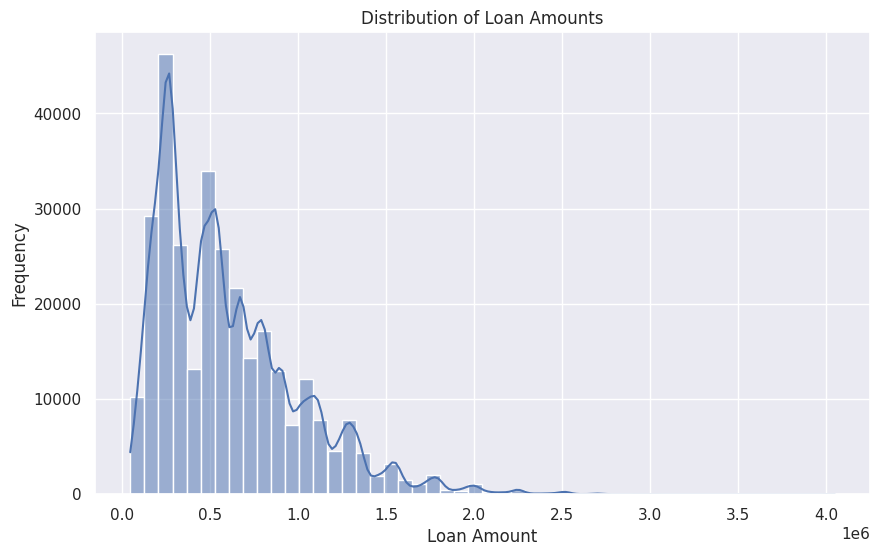

In [31]:


# Load the application_train dataset
# application_train = pd.read_csv('application_train.csv')

# Visualize distribution of loan amounts
plt.figure(figsize=(10, 6))
sns.histplot(data=df_raw, x='AMT_CREDIT', bins=50, kde=True)
plt.title('Distribution of Loan Amounts')
plt.xlabel('Loan Amount')
plt.ylabel('Frequency')
plt.show()


move to bivariate

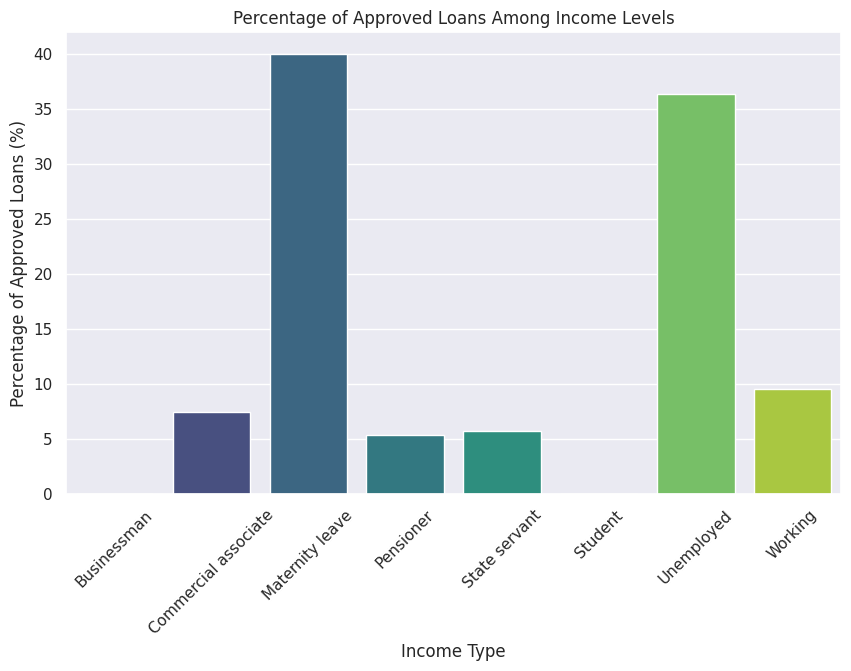

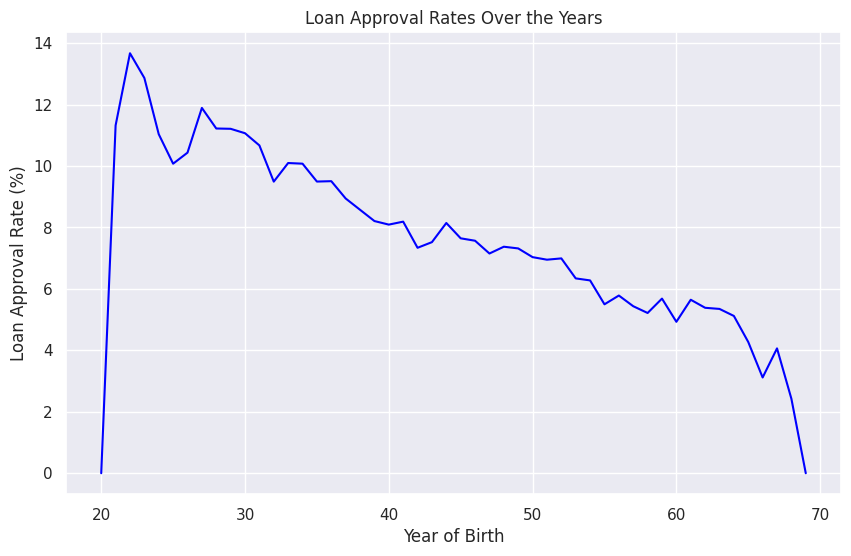

In [32]:
# Calculate the percentage of loans approved among different income levels
income_approval = df_raw.groupby('NAME_INCOME_TYPE')['TARGET'].mean() * 100

# Visualize the percentage of approved loans among income levels
plt.figure(figsize=(10, 6))
sns.barplot(x=income_approval.index, y=income_approval.values, palette='viridis')
plt.title('Percentage of Approved Loans Among Income Levels')
plt.xlabel('Income Type')
plt.ylabel('Percentage of Approved Loans (%)')
plt.xticks(rotation=45)
plt.show()

# Extract year from the 'DAYS_BIRTH' column
df_raw['YEAR_BIRTH'] = -df_raw['DAYS_BIRTH'] // 365

# Calculate loan approval rates over the years
approval_over_years = df_raw.groupby('YEAR_BIRTH')['TARGET'].mean() * 100

# Visualize trends in loan approval rates over the years
plt.figure(figsize=(10, 6))
sns.lineplot(x=approval_over_years.index, y=approval_over_years.values, color='blue')
plt.title('Loan Approval Rates Over the Years')
plt.xlabel('Year of Birth')
plt.ylabel('Loan Approval Rate (%)')
plt.show()
# In this code, replace 'application_train.csv' with the correct path to your dataset file. The code calculates the percentage of loans approved among different income levels and visualizes it using a bar plot. It also calculates and visualizes trends in loan approval rates over the years by grouping applicants based on their birth year.







#  02 - Feature Engineering:
- Derive new attributes based on the original variables to better describe the phenomenon being modeled.

In [33]:
df2=df1.copy()

In [34]:
# DAYS_EMPLOYED_DURATION fix it for year and check the min max to make sure its all good

In [35]:
# define columns to round
columns_to_round=['DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'DAYS_LAST_PHONE_CHANGE']

# loop through the columns to round
for column in columns_to_round:
    new_column_name=f'{column}_DURATION'
    df2[new_column_name]= df2[column] / -365.25
    df2[new_column_name]= df2[new_column_name].apply(lambda d: math.ceil(d))

In [36]:
# df4['EMPLOYMENT_DURATION'] = df4['DAYS_EMPLOYED'] / -365.25
# df4['EMPLOYMENT_DURATION'] = df4['EMPLOYMENT_DURATION'].apply(lambda d: math.ceil(d))
# df4['REGISTRATION_DURATION'] = df4['DAYS_REGISTRATION'] / -365.25
# df4['REGISTRATION_DURATION'] = df4['DAYS_REGISTRATION'].apply(lambda d: math.ceil(d))
# df4['ID_PUBLISH_DURATION'] = df4['DAYS_ID_PUBLISH'] / -365.25
# df4['ID_PUBLISH_DURATION'] = df4['DAYS_ID_PUBLISH'].apply(lambda d: math.ceil(d))

#  03 - Data Filtering:
- Filter the rows and select columns that do not contain information for modeling or that do not match the business scope.

In [37]:
df3=df2.copy()